<a href="https://colab.research.google.com/github/syamkakarla98/Hyperspectral_Image_Analysis_Simplified/blob/master/1D_CNN/Land_cover_classification_of_satellite_imagery_using_Convolutional_Neural_Networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#<font color = 'tomato'>Land cover classification of satellite imagery using Convolutional Neural Networks</font>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Defining the working Directory



In [ ]:
%cd /content/drive/MyDrive



/content/drive/MyDrive


## Import Libraries

In [ ]:
!pip install earthpy

     |████████████████████████████████| 1.4 MB 5.3 MB/s 
     |████████████████████████████████| 1.0 MB 37.6 MB/s 
     |████████████████████████████████| 19.3 MB 349 kB/s 
     |████████████████████████████████| 15.4 MB 37.1 MB/s 
     |████████████████████████████████| 6.3 MB 34.5 MB/s 


In [ ]:
import matplotlib.pyplot as plt

import numpy as np
import earthpy.plot as ep
import seaborn as sns
import earthpy.spatial as es

import plotly.graph_objects as go
import plotly.express as px

from scipy.io import loadmat

import pandas as pd

from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score,
                             confusion_matrix, classification_report)

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, Conv1D, MaxPooling1D, Dropout, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard

from tqdm import tqdm
from numpy.random import seed
from time import time

seed(11)




##Defining the algorithm for CNN


In [10]:
train_images = mnist.train_images()[:1000]
train_labels = mnist.train_labels()[:1000]
test_images = mnist.test_images()[:1000]
test_labels = mnist.test_labels()[:1000]

conv = Conv3x3(8)                  # 28x28x1 -> 26x26x8
pool = MaxPool2()                  # 26x26x8 -> 13x13x8
softmax = Softmax(13 * 13 * 8, 10) # 13x13x8 -> 10

def forward(image, label):
  '''
  Completes a forward pass of the CNN and calculates the accuracy and
  cross-entropy loss.
  - image is a 2d numpy array
  - label is a digit
  '''
  # We transform the image from [0, 255] to [-0.5, 0.5] to make it easier
  # to work with. This is standard practice.
  out = conv.forward((image / 255) - 0.5)
  out = pool.forward(out)
  out = softmax.forward(out)

  # Calculate cross-entropy loss and accuracy. np.log() is the natural log.
  loss = -np.log(out[label])
  acc = 1 if np.argmax(out) == label else 0

  return out, loss, acc

def train(im, label, lr=.005):
  '''
  Completes a full training step on the given image and label.
  Returns the cross-entropy loss and accuracy.
  - image is a 2d numpy array
  - label is a digit
  - lr is the learning rate
  '''
  # Forward
  out, loss, acc = forward(im, label)

  # Calculate initial gradient
  gradient = np.zeros(10)
  gradient[label] = -1 / out[label]

  # Backprop
  gradient = softmax.backprop(gradient, lr)
  gradient = pool.backprop(gradient)
  gradient = conv.backprop(gradient, lr)

  return loss, acc

print('MNIST CNN initialized!')

# Train the CNN for 3 epochs
for epoch in range(3):
  print('--- Epoch %d ---' % (epoch + 1))

  # Shuffle the training data
  permutation = np.random.permutation(len(train_images))
  train_images = train_images[permutation]
  train_labels = train_labels[permutation]

  # Train!
  loss = 0
  num_correct = 0
  for i, (im, label) in enumerate(zip(train_images, train_labels)):
    if i % 100 == 99:
      print(
        '[Step %d] Past 100 steps: Average Loss %.3f | Accuracy: %d%%' %
        (i + 1, loss / 100, num_correct)
      )
      loss = 0
      num_correct = 0

    l, acc = train(im, label)
    loss += l
    num_correct += acc


## Load Data

In [ ]:
data = loadmat('/content/drive/MyDrive/Colab Notebooks/PML CODES/Salinas_corrected.mat')['salinas_corrected']

gt = loadmat('/content/drive/MyDrive/Colab Notebooks/PML CODES/Salinas_gt.mat')['salinas_gt']

print(f'Data Shape: {data.shape[:-1]}\nNumber of Bands: {data.shape[-1]}')

Data Shape: (512, 217)
Number of Bands: 204


In [ ]:
df = pd.DataFrame(data.reshape(data.shape[0]*data.shape[1], -1))

df.columns = [f'band{i}' for i in range(1, df.shape[-1]+1)]

df['class'] = gt.ravel()

In [ ]:
df.head()

,band1,band2,band3,band4,band5,band6,band7,band8,band9,band10,band11,band12,band13,band14,band15,band16,band17,band18,band19,band20,band21,band22,band23,band24,band25,band26,band27,band28,band29,band30,band31,band32,band33,band34,band35,band36,band37,band38,band39,band40,...,band166,band167,band168,band169,band170,band171,band172,band173,band174,band175,band176,band177,band178,band179,band180,band181,band182,band183,band184,band185,band186,band187,band188,band189,band190,band191,band192,band193,band194,band195,band196,band197,band198,band199,band200,band201,band202,band203,band204,class
0,290,381,585,1041,1316,1397,1319,1462,1643,1683,1656,1670,1584,1643,1659,1619,1723,1785,1805,1822,1809,1790,1786,1770,1779,1737,1706,1709,1699,1663,1702,1682,1715,1682,1603,1615,1746,1784,1607,1757,...,424,429,437,409,391,378,364,354,329,340,344,337,321,310,291,284,272,254,240,250,216,220,192,162,173,149,134,129,138,104,96,109,93,54,79,54,36,11,17,0
1,290,381,519,1041,1316,1352,1319,1462,1643,1683,1656,1670,1594,1613,1649,1619,1706,1767,1796,1805,1785,1798,1786,1770,1787,1745,1714,1741,1722,1656,1734,1722,1731,1728,1611,1623,1746,1777,1593,1724,...,429,440,439,409,389,382,370,360,331,342,347,340,323,305,298,282,275,254,240,248,211,225,192,162,180,147,136,131,138,111,94,111,96,56,83,56,36,11,15,0
2,290,381,585,1041,1286,1352,1300,1412,1614,1644,1632,1636,1573,1613,1619,1591,1670,1704,1734,1763,1744,1748,1726,1721,1732,1698,1674,1701,1675,1610,1694,1682,1666,1651,1566,1565,1704,1735,1540,1691,...,417,422,420,395,377,368,358,351,324,332,335,325,318,302,283,276,265,251,240,236,223,216,188,162,176,142,125,129,129,106,88,107,89,54,81,54,30,11,11,0
3,290,381,585,999,1316,1374,1280,1380,1584,1631,1596,1603,1531,1562,1580,1526,1617,1668,1707,1704,1703,1698,1675,1680,1677,1651,1609,1620,1605,1571,1615,1609,1601,1604,1513,1499,1647,1660,1486,1620,...,401,408,411,387,365,361,346,339,310,316,325,318,304,285,276,267,260,239,223,234,201,209,176,161,164,136,127,123,131,100,86,105,85,56,75,50,30,11,19,0
4,219,381,585,999,1286,1352,1261,1396,1555,1618,1596,1558,1489,1532,1531,1508,1599,1632,1672,1687,1662,1664,1658,1639,1645,1612,1585,1596,1589,1525,1583,1569,1568,1566,1468,1478,1605,1612,1446,1574,...,394,410,397,376,356,351,340,332,303,318,321,315,297,287,271,265,246,230,216,226,194,202,178,150,167,127,125,120,122,96,83,105,83,48,75,50,24,9,17,0


### Description of Classes

|Label |Class	|Samples|
|------|------|-------|
1|	Brocoli_green_weeds_1	|2009
2|	Brocoli_green_weeds_2	|3726
3|	Fallow	|1976
4	|Fallow_rough_plow|	1394
5	|Fallow_smooth	|2678
6|	Stubble	|3959
7	|Celery	|3579
8	|Grapes_untrained	|11271
9	|Soil_vinyard_develop|	6203
10|	Corn_senesced_green_weeds|	3278
11|	Lettuce_romaine_4wk	|1068
12|	Lettuce_romaine_5wk	|1927
13|	Lettuce_romaine_6wk	|916
14|	Lettuce_romaine_7wk	|1070
15|	Vinyard_untrained|	7268
16|	Vinyard_vertical_trellis|	1807



## Data Visualization

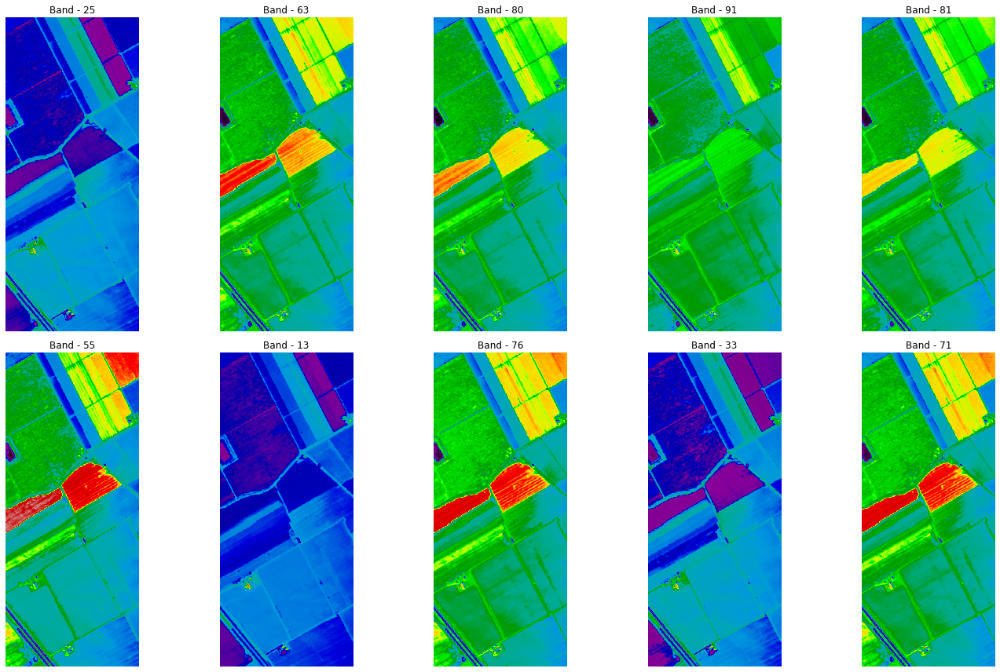

In [ ]:
fig = plt.figure(figsize = (20, 12))

ax = fig.subplots(2, 5)

for i in range(2):
  for j in range(5):
    c = np.random.randint(103)
    ax[i][j].imshow(data[:, :, c], cmap='nipy_spectral')
    ax[i][j].axis('off')
    ax[i][j].title.set_text(f"Band - {c}")
    c+=1

plt.tight_layout()
plt.show()


## RGB Composite Image

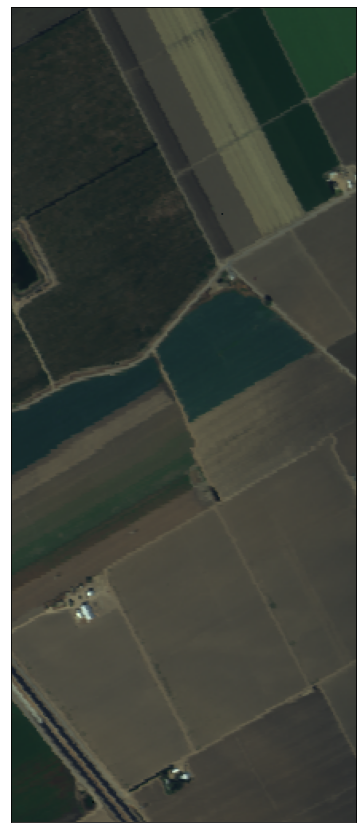

In [ ]:
mdata = np.moveaxis(data, -1, 0)

ep.plot_rgb(mdata, (29, 19, 9), figsize=(15, 15)) 

plt.show()

## GroundTruth Visualizaation

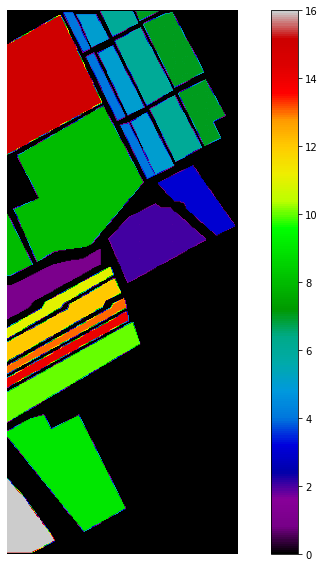

In [ ]:
def plot_data(data):
  fig = plt.figure(figsize=(12, 10))
  plt.imshow(data, cmap='nipy_spectral')
  plt.colorbar()
  plt.axis('off')
  plt.show()

plot_data(gt)

## Scaling Data

In [ ]:
t_df = df[df['class']!=0]

ind = ['band'+str(i) for i in range(1, t_df.shape[-1])]

X = t_df.loc[:, ind]

y = to_categorical(t_df.loc[:, 'class'])

X_scaled = minmax_scale(X, axis = 0);

X_scaled.shape, y.shape

((54129, 204), (54129, 17))

## Split Data 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y,
                                                    stratify=y, 
                                                    test_size=0.30)
print(f"X_train: {X_train.shape}\ny_train: {y_train.shape}\nX_test: {X_test.shape}\ny_test: {y_test.shape}") 

X_train: (37890, 204)
y_train: (37890, 17)
X_test: (16239, 204)
y_test: (16239, 17)


## Build CNN

In [ ]:
ip_shape = X_train[1].shape

n_outputs = y_train.shape[1]

X_train[1].ravel().shape

(204,)

In [ ]:
X_train = X_train.reshape(-1, 204, 1)
X_test = X_test.reshape(-1, 204, 1)


In [ ]:
model = Sequential(name = 'Salinas_CNN')

model.add(Conv1D(filters = 64, kernel_size = 3, activation ='relu', input_shape =(ip_shape[0],1), name = 'Layer1'))
model.add(Conv1D(filters = 64, kernel_size = 3, activation ='relu' , name = 'Layer2'))
model.add(Conv1D(filters = 64, kernel_size = 3, activation ='relu' , name = 'Layer3'))

model.add(MaxPooling1D(pool_size = 2, name = 'MaxPooling_Layer1'))
model.add(Dropout(0.4, name = 'Dropout1'))

model.add(Conv1D(filters = 32, kernel_size = 3, activation ='relu', name = 'Layer4'))
model.add(Conv1D(filters = 32, kernel_size = 3, activation ='relu', name = 'Layer5'))
model.add(Conv1D(filters = 32, kernel_size = 3, activation ='relu', name = 'Layer6'))

model.add(MaxPooling1D(pool_size = 2, name = 'MaxPooling_Layer2'))
model.add(Dropout(0.4, name = 'Dropout2'))

model.add(Flatten(name = 'Flatten'))

model.add(Dense(25, activation='relu', name = 'DenseLayer'))

model.add(Dense(n_outputs, activation='softmax', name = 'OutputLayer'))


model.summary()

Model: "Salinas_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Layer1 (Conv1D)             (None, 202, 64)           256       
                                                                 
 Layer2 (Conv1D)             (None, 200, 64)           12352     
                                                                 
 Layer3 (Conv1D)             (None, 198, 64)           12352     
                                                                 
 MaxPooling_Layer1 (MaxPooli  (None, 99, 64)           0         
 ng1D)                                                           
                                                                 
 Dropout1 (Dropout)          (None, 99, 64)            0         
                                                                 
 Layer4 (Conv1D)             (None, 97, 32)            6176      
                                                       

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
early_stop = EarlyStopping(monitor = 'val_loss',
                            mode = 'min',
                            min_delta = 0,
                            patience = 10,
                            restore_best_weights = True)

checkpoint = ModelCheckpoint(filepath = 'Salinas_Model.h5', 
                             monitor = 'val_loss', 
                             mode ='min', 
                             save_best_only = True)

tensorboard = TensorBoard(log_dir='SA_logs/{}'.format(time()))

In [ ]:
hist = model.fit(X_train, 
                       y_train, 
                       epochs = 100, 
                       batch_size = 256 , 
                       validation_data = (X_test, y_test), 
                       callbacks=[early_stop,
                                  checkpoint,
                                  tensorboard])
 

Epoch 1/100
149/149 [==============================] - 15s 27ms/step - loss: 1.4794 - accuracy: 0.5077 - val_loss: 0.6544 - val_accuracy: 0.7480
Epoch 2/100
149/149 [==============================] - 3s 17ms/step - loss: 0.5647 - accuracy: 0.7725 - val_loss: 0.6078 - val_accuracy: 0.7609
Epoch 3/100
149/149 [==============================] - 2s 17ms/step - loss: 0.4751 - accuracy: 0.8088 - val_loss: 1.3231 - val_accuracy: 0.5612
Epoch 4/100
149/149 [==============================] - 2s 15ms/step - loss: 0.4794 - accuracy: 0.8083 - val_loss: 0.4232 - val_accuracy: 0.7839
Epoch 5/100
149/149 [==============================] - 3s 17ms/step - loss: 0.4038 - accuracy: 0.8372 - val_loss: 0.3616 - val_accuracy: 0.8512
Epoch 6/100
149/149 [==============================] - 3s 17ms/step - loss: 0.3820 - accuracy: 0.8459 - val_loss: 0.3478 - val_accuracy: 0.8664
Epoch 7/100
149/149 [==============================] - 3s 17ms/step - loss: 0.3613 - accuracy: 0.8541 - val_loss: 0.3135 - val_accuracy

In [ ]:
%load_ext tensorboard

%tensorboard --logdir SA_logs/

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
hist = pd.DataFrame(data= hist.history)

fig = go.Figure()

fig.add_trace(go.Scatter(x = hist.index, y = hist.loss.values,
                    mode='lines+markers',
                    name='Train Loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.accuracy.values,
                    mode='lines+markers',
                    name='Train Accuracy'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_loss.values,
                    mode='lines+markers', name='Test loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_accuracy.values,
                    mode='lines+markers', name='Test Accuracy'))

fig.show()

In [ ]:
loss, acc = model.evaluate(X_test, y_test)

508/508 [==============================] - 2s 4ms/step - loss: 0.2062 - accuracy: 0.9153


In [ ]:
print(f"Accuracy: {acc*100}\nLoss: {loss}")

Accuracy: 91.52657389640808
Loss: 0.2062045931816101


In [ ]:
from tensorflow.keras.models import load_model

model = load_model("Salinas_Model.h5")

In [ ]:
pred = np.argmax(model.predict(X_test), axis=1)

# Classification Report
print(classification_report(pred, np.argmax(y_test, 1),
      target_names = ['1.Brocoli_green_weeds_1', '2.Brocoli_green_weeds_2',
                      '3.Fallow',
                      '4.Fallow_rough_plow',
                      '5.Fallow_smooth',
                      '6.Stubble',
                      '7.Celery',
                      '8.Grapes_untrained',
                      '9.Soil_vinyard_develop',
                      '10.Corn_senesced_green_weeds',
                      '11.Lettuce_romaine_4wk',
                      '12.Lettuce_romaine_5wk',
                      '13.Lettuce_romaine_6wk',
                      '14.Lettuce_romaine_7wk',
                      '15.Vinyard_untrained',
                      '16.Vinyard_vertical_trellis']))

                              precision    recall  f1-score   support

     1.Brocoli_green_weeds_1       0.99      1.00      0.99       596
     2.Brocoli_green_weeds_2       1.00      0.99      0.99      1126
                    3.Fallow       1.00      0.95      0.98       619
         4.Fallow_rough_plow       1.00      0.99      1.00       422
             5.Fallow_smooth       0.99      0.99      0.99       803
                   6.Stubble       1.00      1.00      1.00      1188
                    7.Celery       1.00      1.00      1.00      1069
          8.Grapes_untrained       0.86      0.79      0.83      3688
      9.Soil_vinyard_develop       1.00      0.99      0.99      1878
10.Corn_senesced_green_weeds       0.93      0.93      0.93       984
      11.Lettuce_romaine_4wk       0.95      0.95      0.95       321
      12.Lettuce_romaine_5wk       0.99      0.98      0.99       585
      13.Lettuce_romaine_6wk       0.98      0.96      0.97       279
      14.Lettuce_ro

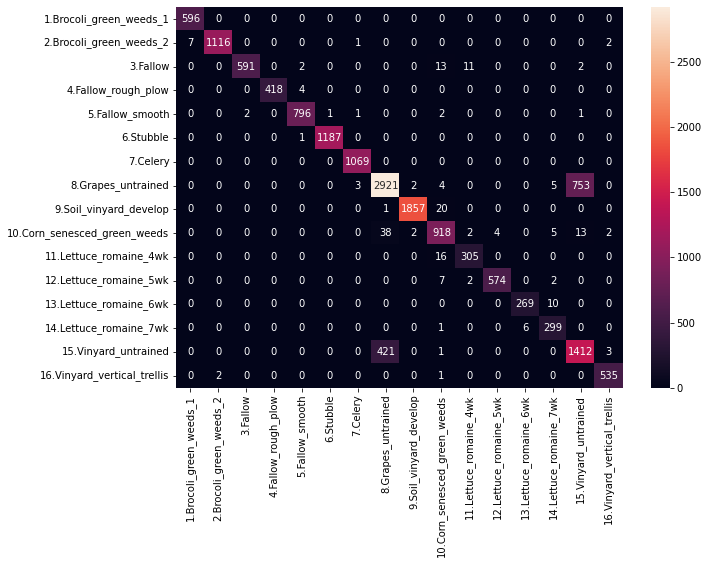

In [ ]:
plt.figure(figsize = (10,7))

classes = ['1.Brocoli_green_weeds_1', '2.Brocoli_green_weeds_2',
                      '3.Fallow',
                      '4.Fallow_rough_plow',
                      '5.Fallow_smooth',
                      '6.Stubble',
                      '7.Celery',
                      '8.Grapes_untrained',
                      '9.Soil_vinyard_develop',
                      '10.Corn_senesced_green_weeds',
                      '11.Lettuce_romaine_4wk',
                      '12.Lettuce_romaine_5wk',
                      '13.Lettuce_romaine_6wk',
                      '14.Lettuce_romaine_7wk',
                      '15.Vinyard_untrained',
                      '16.Vinyard_vertical_trellis']

mat = confusion_matrix(np.add(pred, 1), np.add(np.argmax(y_test, 1), 1))

df_cm = pd.DataFrame(mat, index = classes, columns = classes)

sns.heatmap(df_cm, annot=True, fmt='d')

plt.show()



---

